In [1]:
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import yfinance as yf

In [2]:
start = '2000-01-01'
end = '2023-12-21'
stock = 'GOOG'

data = yf.download(stock, start, end)

[*********************100%%**********************]  1 of 1 completed


In [3]:
data.reset_index(inplace=True)

In [4]:
data

,Date,Open,High,Low,Close,Adj Close,Volume
0,2004-08-19,2.490664,2.591785,2.390042,2.499133,2.499133,897427216
1,2004-08-20,2.515820,2.716817,2.503118,2.697639,2.697639,458857488
2,2004-08-23,2.758411,2.826406,2.716070,2.724787,2.724787,366857939
3,2004-08-24,2.770615,2.779581,2.579581,2.611960,2.611960,306396159
4,2004-08-25,2.614201,2.689918,2.587302,2.640104,2.640104,184645512
...,...,...,...,...,...,...,...
4864,2023-12-14,134.770004,135.035004,131.059998,133.199997,133.199997,29619100
4865,2023-12-15,132.919998,134.830002,132.630005,133.839996,133.839996,58569400
4866,2023-12-18,133.860001,138.380005,133.770004,137.190002,137.190002,25699800
4867,2023-12-19,138.000000,138.770004,137.449997,138.100006,138.100006,20661000


In [5]:
ma_100_days = data.Close.rolling(100).mean()

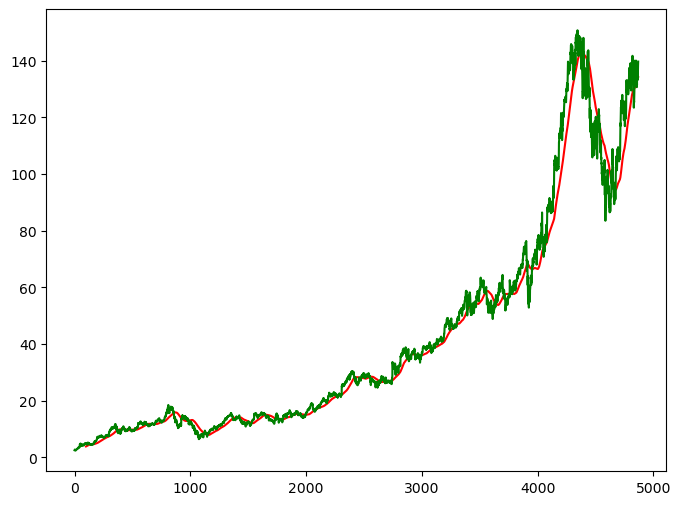

In [6]:
plt.figure(figsize=(8,6))
plt.plot(ma_100_days, 'r')
plt.plot(data.Close, 'g')
plt.show()

In [7]:
ma_200_days = data.Close.rolling(200).mean()

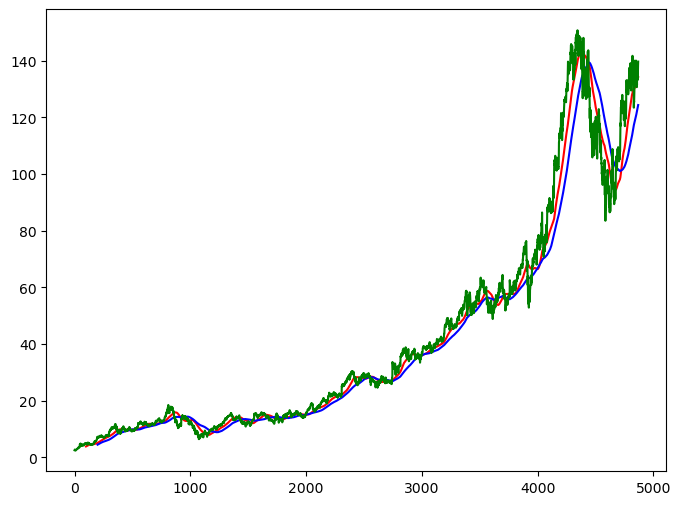

In [8]:
plt.figure(figsize=(8,6))
plt.plot(ma_100_days, 'r')
plt.plot(ma_200_days,'b')
plt.plot(data.Close,'g')
plt.show()

In [9]:
data.dropna(inplace=True)

In [10]:
data_train = pd.DataFrame(data.Close[0: int(len(data)*0.80)])
data_test = pd.DataFrame(data.Close[int(len(data)*0.80): len(data)])

In [11]:
data_train.shape[0]

3895

In [12]:
data_test.shape[0]

974

In [13]:
from sklearn.preprocessing import MinMaxScaler
scaler = MinMaxScaler(feature_range=(0,1))

In [14]:
data_train_scale = scaler.fit_transform(data_train)

In [132]:
data_train_scale

array([[1.14421138e-04],
       [2.87752668e-03],
       [3.25541379e-03],
       ...,
       [9.73260645e-01],
       [9.92747987e-01],
       [9.94835936e-01]])

In [133]:
dfTrainX = data_train['Close']
dfTrainX

0        2.499133
1        2.697639
2        2.724787
3        2.611960
4        2.640104
          ...    
3890    74.296997
3891    72.353500
3892    72.411499
3893    73.811501
3894    73.961502
Name: Close, Length: 3895, dtype: float64

In [134]:
dfTrainX.shape

(3895,)

In [105]:
x = []
y = []

for i in range(100, data_train_scale.shape[0]):
    x.append(data_train_scale[i-100:i])
    y.append(data_train_scale[i,0])
    

In [106]:
# MOVING AVG ARRAY

for i in range(len(x)):
    print(x[i])
    print('\n')

[[1.14421138e-04]
 [2.87752668e-03]
 [3.25541379e-03]
 [1.68491581e-03]
 [2.07666832e-03]
 [2.73884606e-03]
 [2.12867190e-03]
 [6.93386521e-04]
 [8.18191781e-04]
 [8.32123562e-05]
 [5.20035743e-04]
 [0.00000000e+00]
 [5.44308502e-04]
 [7.93928977e-04]
 [7.97393670e-04]
 [1.84439122e-03]
 [2.59670075e-03]
 [3.97999582e-03]
 [4.15680134e-03]
 [4.83977387e-03]
 [6.06012552e-03]
 [6.70842789e-03]
 [6.18146277e-03]
 [6.36866568e-03]
 [7.21459823e-03]
 [6.87137132e-03]
 [6.32707609e-03]
 [9.30859333e-03]
 [1.07716195e-02]
 [1.02585164e-02]
 [1.12916519e-02]
 [1.21514299e-02]
 [1.32989700e-02]
 [1.28517492e-02]
 [1.34653781e-02]
 [1.30770936e-02]
 [1.22207769e-02]
 [1.29626890e-02]
 [1.41760947e-02]
 [1.45574465e-02]
 [1.52889612e-02]
 [1.70397427e-02]
 [1.66167847e-02]
 [1.40339494e-02]
 [1.71160091e-02]
 [2.51071863e-02]
 [3.02971032e-02]
 [2.83556541e-02]
 [2.98013468e-02]
 [3.23425660e-02]
 [3.14203804e-02]
 [3.32890244e-02]
 [3.28868745e-02]
 [3.17774627e-02]
 [2.93610455e-02]
 [2.403937

In [107]:
npx = np.array(x)
npx.shape

(3795, 100, 1)

In [80]:
df = pd.DataFrame(npx)
df

,0
0,0.000114
1,0.002878
2,0.003255
3,0.001685
4,0.002077
...,...
3790,0.804674
3791,0.814536
3792,0.824336
3793,0.828031


In [108]:
x, y = np.array(x), np.array(y)

In [109]:
from keras.layers import Dense, Dropout, LSTM
from keras.models import Sequential

In [110]:
model = Sequential()
model.add(LSTM(units = 50, activation = 'relu', return_sequences = True,
               input_shape = ((x.shape[1],1))))
model.add(Dropout(0.2))

model.add(LSTM(units = 60, activation='relu', return_sequences = True))
model.add(Dropout(0.3))

model.add(LSTM(units = 80, activation = 'relu', return_sequences = True))
model.add(Dropout(0.4))

model.add(LSTM(units = 120, activation = 'relu'))
model.add(Dropout(0.5))

model.add(Dense(units =1))

In [111]:
model.compile(optimizer = 'adam', loss = 'mean_squared_error')

In [ ]:
model.fit(x,y, epochs = 10, batch_size =32, verbose =1)

In [113]:
model.summary()

Model: "sequential_3"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 lstm_8 (LSTM)               (None, 100, 50)           10400     
                                                                 
 dropout_8 (Dropout)         (None, 100, 50)           0         
                                                                 
 lstm_9 (LSTM)               (None, 100, 60)           26640     
                                                                 
 dropout_9 (Dropout)         (None, 100, 60)           0         
                                                                 
 lstm_10 (LSTM)              (None, 100, 80)           45120     
                                                                 
 dropout_10 (Dropout)        (None, 100, 80)           0         
                                                                 
 lstm_11 (LSTM)              (None, 120)              

In [114]:
pas_100_days = data_train.tail(100)

In [115]:
data_test = pd.concat([pas_100_days, data_test], ignore_index=True)

In [116]:
data_test_scale  =  scaler.fit_transform(data_test)

In [117]:
x = []
y = []

for i in range(100, data_test_scale.shape[0]):
    x.append(data_test_scale[i-100:i])
    y.append(data_test_scale[i,0])
x, y = np.array(x), np.array(y)


In [118]:
x.shape

(1174, 100, 1)

In [119]:
x

array([[[0.08813522],
        [0.08980054],
        [0.09301886],
        ...,
        [0.20005004],
        [0.21435358],
        [0.21588611]],

       [[0.08980054],
        [0.09301886],
        [0.08853365],
        ...,
        [0.21435358],
        [0.21588611],
        [0.08813522]],

       [[0.09301886],
        [0.08853365],
        [0.09062812],
        ...,
        [0.21588611],
        [0.08813522],
        [0.08980054]],

       ...,

       [[0.78709204],
        [0.81917279],
        [0.82019453],
        ...,
        [0.82898099],
        [0.82111401],
        [0.82765276]],

       [[0.81917279],
        [0.82019453],
        [0.80773003],
        ...,
        [0.82111401],
        [0.82765276],
        [0.8618791 ]],

       [[0.82019453],
        [0.80773003],
        [0.77452542],
        ...,
        [0.82765276],
        [0.8618791 ],
        [0.87117643]]])

In [ ]:
dfTestX = pd.DataFrame(x)
dfTestX

In [97]:
dfTestY = pd.DataFrame(y)
dfTestY

,0
0,0.088135
1,0.089801
2,0.093019
3,0.088534
4,0.090628
...,...
1069,0.821114
1070,0.827653
1071,0.861879
1072,0.871176


In [120]:
y_predict = model.predict(x)

37/37 [==============================] - 3s 61ms/step


In [121]:
scale =1/scaler.scale_

In [122]:
y_predict = y_predict*scale

In [123]:
y = y*scale

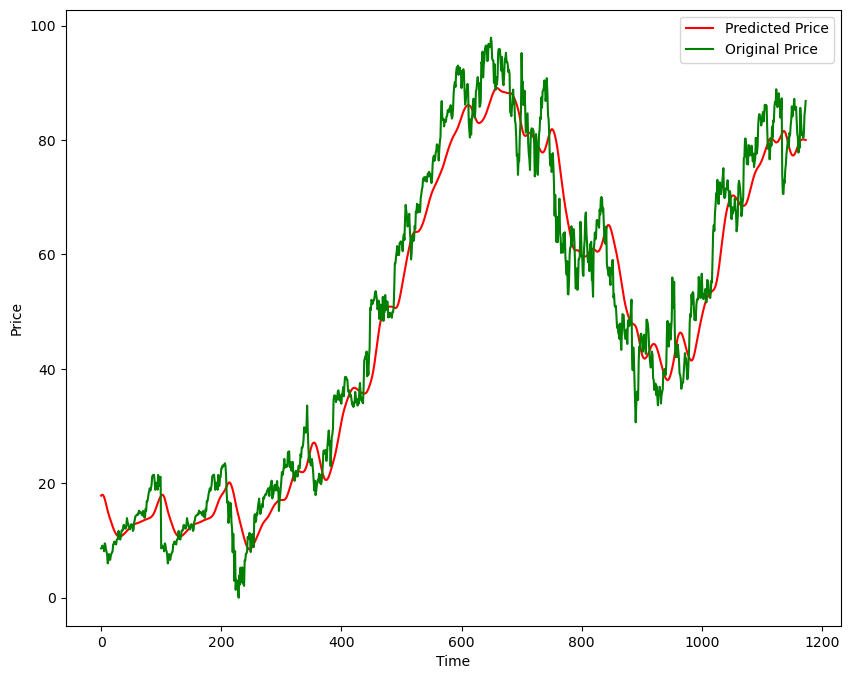

In [124]:
plt.figure(figsize=(10,8))
plt.plot(y_predict, 'r', label = 'Predicted Price')
plt.plot(y, 'g', label = 'Original Price')
plt.xlabel('Time')
plt.ylabel('Price')
plt.legend()
plt.show()

In [125]:
model.save('Lreview .keras')

In [126]:
from sklearn.metrics import mean_squared_error
def model_evaluate(): 
    errors = mean_squared_error(y, y_predict)

    print("MSE ", errors)

In [127]:
model_evaluate()

MSE  36.641469178715106


In [128]:
import lime
import lime.lime_tabular


In [69]:
# LIME has one explainer for all the models
explainer = lime.lime_tabular.LimeTabularExplainer(dfTestX.values, feature_names=['Moving Avg'],
                                                  class_names=['Close'], verbose=True, mode='regression')

In [ ]:
j = 5
exp = explainer.explain_instance(dfTestX.values[j], model.predict, num_features=1)

In [ ]:
exp.show_in_notebook(show_table=True)


In [ ]:
exp.as_list()


[('Moving Avg <= 0.13', -0.2735358736927778)]

In [ ]:
j = 500
exp = explainer.explain_instance(dfTestX.values[j], model.predict, num_features=1)

 71/157 [============>.................] - ETA: 0s

157/157 [==============================] - 0s 2ms/step
Intercept 0.19860965275193115
Prediction_local [0.69458225]
Right: 0.7765866


In [ ]:
exp.show_in_notebook(show_table=True)


In [ ]:
exp.as_list()


[('Moving Avg > 0.45', 0.49597260182332564)]

In [ ]:
for i in range(974):
    exp = explainer.explain_instance(dfTestX.values[i], model.predict, num_features=1)
    print(i)
    print('\n')
    print(exp.as_list())
    print('\n')
    

157/157 [==============================] - 1s 3ms/step
Intercept 0.39614809179819577
Prediction_local [0.11323394]
Right: 0.12038016
0


[('Moving Avg <= 0.13', -0.2829141525758814)]


157/157 [==============================] - 0s 2ms/step
Intercept 0.39235761710136086
Prediction_local [0.1143128]
Right: 0.121253505
1


[('Moving Avg <= 0.13', -0.2780448206221855)]


157/157 [==============================] - 0s 1ms/step
Intercept 0.3957812791976385
Prediction_local [0.11422568]
Right: 0.12302981
2


[('Moving Avg <= 0.13', -0.281555599487947)]


157/157 [==============================] - 0s 2ms/step
Intercept 0.3942162321503644
Prediction_local [0.11396031]
Right: 0.12058422
3


[('Moving Avg <= 0.13', -0.2802559183648421)]


157/157 [==============================] - 0s 2ms/step
Intercept 0.3968677963649596
Prediction_local [0.11319818]
Right: 0.12171006
4


[('Moving Avg <= 0.13', -0.2836696197034813)]


157/157 [==============================] - 0s 2ms/step
Intercept 0.397527934101